# 국가 및 권역별 전산업, 소재부품장비산업별 수출입

In [73]:
# 라이브러리 로드
import pandas as pd
import numpy as np 
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

In [74]:
import koreanize_matplotlib

%config InlineBackend.figure_format = 'retina'

# 파일 읽어오기 

In [75]:
from glob import glob

file_name = glob("kosis*.csv")[0]
file_name

'kosis-country-import-export.csv'

In [76]:
raw = pd.read_csv(file_name, encoding="cp949")
raw.head(2)

,국가및권역별,전산업·소재부품장비산업별,항목,단위,2012.01 월,2012.02 월,2012.03 월,2012.04 월,2012.05 월,2012.06 월,...,2021.11 월,2021.12 월,2022.01 월,2022.02 월,2022.03 월,2022.04 월,2022.05 월,2022.06 월,2022.07 월,Unnamed: 131
0,아시아,전산업,수출액[$],$,23745190192,25861715382,27042203441,24836676895,26371848084,26499484039,...,36346715452,37023197693,32765720364,32142243305,38202799098,33731657051,35060245380,33257938412,34407442491,NaN
1,아시아,전산업,수입액[$],$,18220312420,18433708853,19946987738,18971147138,18423759290,18244097495,...,27607486829,28970294456,28015516969,24779680062,29877276004,28088134473,29513619417,29156633254,28277360345,NaN


In [77]:
raw.shape

(208, 132)

# 결측치 

In [78]:
raw.isnull().sum().sum()

208

<AxesSubplot:>

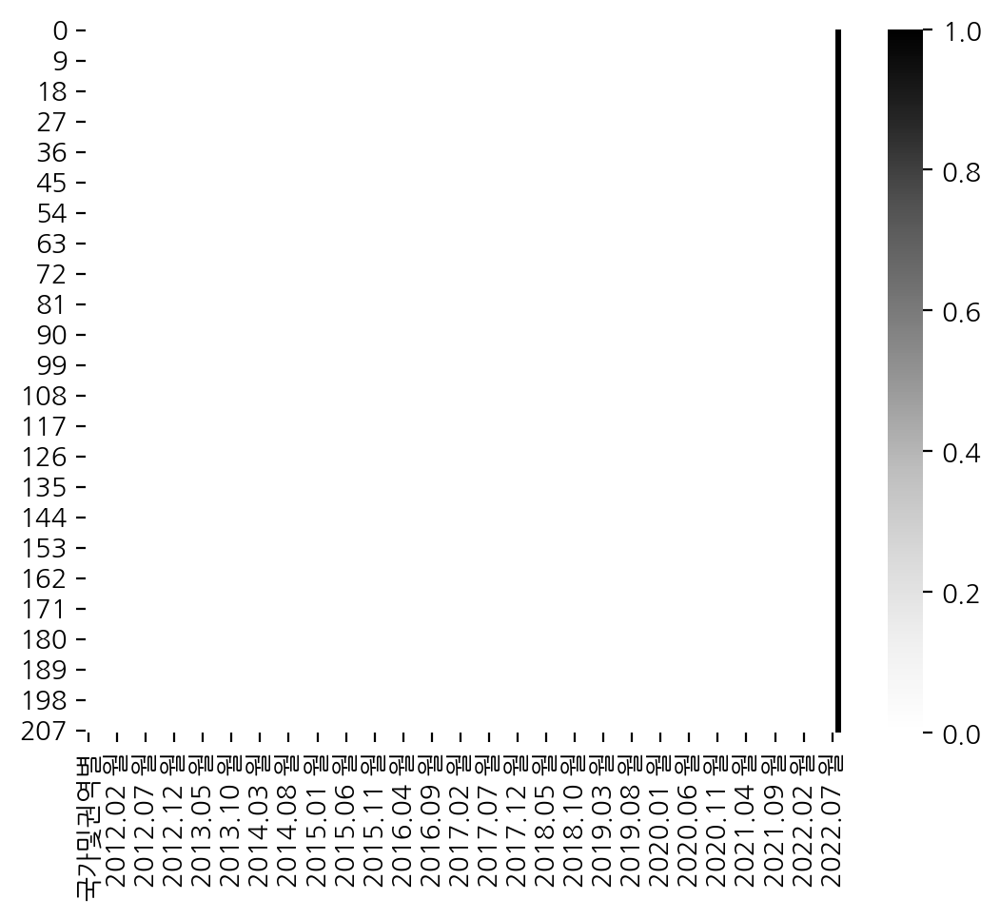

In [79]:
# 결측치 시각화
sns.heatmap(raw.isnull(), cmap="Greys")

# tidy data로 변환

In [80]:
raw.columns

Index(['국가및권역별', '전산업·소재부품장비산업별', '항목', '단위', '2012.01 월', '2012.02 월',
       '2012.03 월', '2012.04 월', '2012.05 월', '2012.06 월',
       ...
       '2021.11 월', '2021.12 월', '2022.01 월', '2022.02 월', '2022.03 월',
       '2022.04 월', '2022.05 월', '2022.06 월', '2022.07 월', 'Unnamed: 131'],
      dtype='object', length=132)

In [81]:
df = raw.melt(id_vars=raw.columns[:4], var_name="연월", value_name="달러")
df

,국가및권역별,전산업·소재부품장비산업별,항목,단위,연월,달러
0,아시아,전산업,수출액[$],$,2012.01 월,2.374519e+10
1,아시아,전산업,수입액[$],$,2012.01 월,1.822031e+10
2,아시아,소재·부품·장비산업,수출액[$],$,2012.01 월,1.387728e+10
3,아시아,소재·부품·장비산업,수입액[$],$,2012.01 월,1.011782e+10
4,일본,전산업,수출액[$],$,2012.01 월,3.270842e+09
...,...,...,...,...,...,...
26619,OPEC,소재·부품·장비산업,수입액[$],$,Unnamed: 131,NaN
26620,개발도상국,전산업,수출액[$],$,Unnamed: 131,NaN
26621,개발도상국,전산업,수입액[$],$,Unnamed: 131,NaN
26622,개발도상국,소재·부품·장비산업,수출액[$],$,Unnamed: 131,NaN


In [83]:
# 결측치 제거
df = df.dropna()
df.shape

(26416, 6)

In [84]:
df = df.drop(columns="단위")
df

,국가및권역별,전산업·소재부품장비산업별,항목,연월,달러
0,아시아,전산업,수출액[$],2012.01 월,2.374519e+10
1,아시아,전산업,수입액[$],2012.01 월,1.822031e+10
2,아시아,소재·부품·장비산업,수출액[$],2012.01 월,1.387728e+10
3,아시아,소재·부품·장비산업,수입액[$],2012.01 월,1.011782e+10
4,일본,전산업,수출액[$],2012.01 월,3.270842e+09
...,...,...,...,...,...
26411,OPEC,소재·부품·장비산업,수입액[$],2022.07 월,1.082001e+08
26412,개발도상국,전산업,수출액[$],2022.07 월,3.308393e+10
26413,개발도상국,전산업,수입액[$],2022.07 월,3.736663e+10
26414,개발도상국,소재·부품·장비산업,수출액[$],2022.07 월,1.854409e+10


# 텍스트 전처리

## 항목 컬럼 끝에 "[$]" 삭제 

In [86]:
# 정규식으로 삭제
df["항목"] = df["항목"].str.replace("액\[\$\]", "", regex=True)

In [69]:
# 슬라이싱으로 삭제
df["항목"] = df["항목"].str.slice(start=0, stop=2)
df.head(2)

,국가및권역별,전산업·소재부품장비산업별,항목,연월,달러,연,월
0,아시아,전산업,수출,2012.01 .,2.374519e+10,2012,1
1,아시아,전산업,수입,2012.01 .,1.822031e+10,2012,1


## 연월 컬럼에서 "월" 삭제

In [88]:
# replace로 삭제
df['연월'] = df["연월"].str.replace("월", "")

In [ ]:
# 정규표현식으로 삭제
df["연월"] = df['연월'].str.replace('[^0-9.]', "", regex=True)

In [89]:
df["연월"].map(lambda x: x.split('.'))
df["연"] = df["연월"].map(lambda x: int(x.split('.')[0]))
df["월"] = df["연월"].map(lambda x: int(x.split('.')[1]))

In [92]:
df.sample(5)

,국가및권역별,전산업·소재부품장비산업별,항목,연월,달러,연,월
17613,미국,전산업,수입,2019.01,5.290688e+09,2019,1
14962,LAIA,소재·부품·장비산업,수출,2017.12,1.086371e+09,2017,12
23193,스웨덴,전산업,수입,2021.04,2.084348e+08,2021,4
4022,이탈리아,소재·부품·장비산업,수출,2013.08,1.552101e+08,2013,8
23976,아랍에미리트,전산업,수출,2021.08,3.723963e+08,2021,8


# 컬럼명 변경 

In [94]:
cols = df.columns
cols

Index(['국가및권역별', '전산업·소재부품장비산업별', '항목', '연월', '달러', '연', '월'], dtype='object')

In [97]:
df = df.rename(columns={cols[0]:"국가권역", cols[1]:"산업"})
df.head(2)

,국가권역,산업,항목,연월,달러,연,월
0,아시아,전산업,수출,2012.01,2.374519e+10,2012,1
1,아시아,전산업,수입,2012.01,1.822031e+10,2012,1


# 시각화 

In [98]:
df.describe()

,달러,연,월
count,2.641600e+04,26416.000000,26416.000000
mean,2.285932e+09,2016.803150,6.362205
std,4.809561e+09,3.061218,3.436024
min,1.623000e+03,2012.000000,1.000000
25%,1.133350e+08,2014.000000,3.000000
50%,3.995205e+08,2017.000000,6.000000
75%,1.801346e+09,2019.000000,9.000000
max,3.820280e+10,2022.000000,12.000000


In [100]:
df.describe(include='object')

,국가권역,산업,항목,연월
count,26416,26416,26416,26416
unique,52,2,2,127
top,아시아,전산업,수출,2012.01
freq,508,13208,13208,208


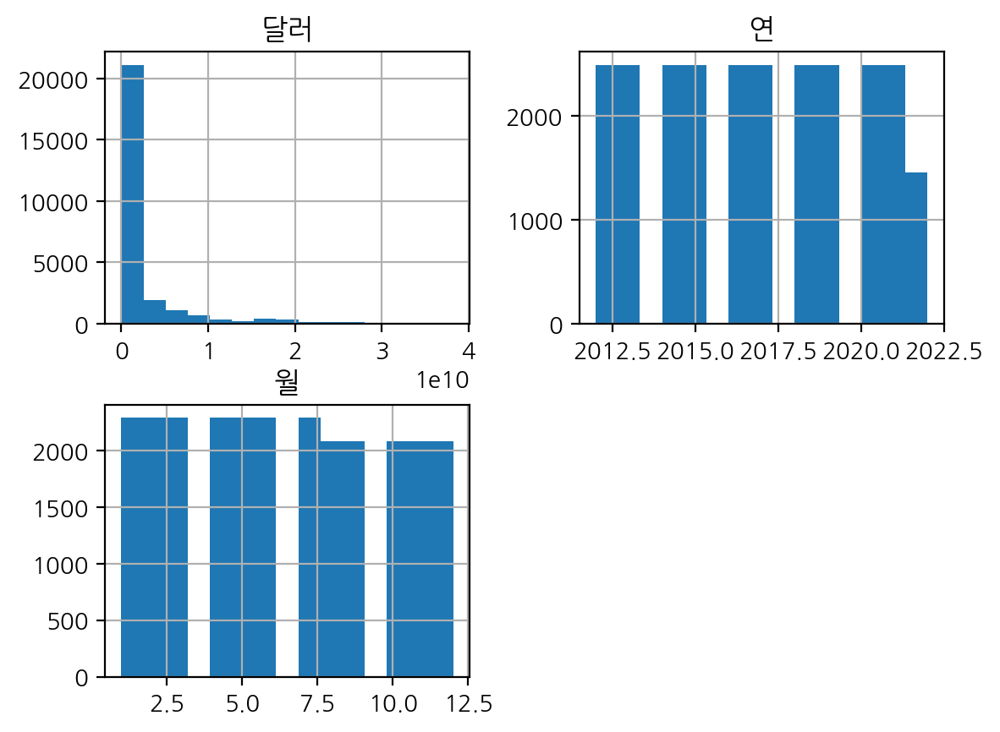

In [104]:
df.hist(bins=15);

# plotly 시각화 

In [115]:
# 왜곡을 막기 위해 나라, 권역을 분리 
df["국가권역"].unique()

array(['아시아', '일본', '대만', '필리핀', '홍콩', '말레이지아', '싱가포르', '인도네시아', '태국',
       '인도', '베트남', '중국', '중동', '사우디아라비아', '아랍에미리트', '유럽', '프랑스', '이탈리아',
       '독일', '네덜란드', '영국', '벨기에', '스페인', '스위스', '오스트리아', '노르웨이', '스웨덴',
       '핀란드', '폴란드', '체코공화국', '루마니아', '불가리아', '러시아', '북미', '캐나다', '미국',
       '중남미', '멕시코', '아르헨티나', '칠레', '브라질', '아프리카', '남아프리카공화국', '오세아니아',
       '기타지역', 'EU(27)', 'OECD', 'ASEAN', 'LAIA', '선진국', 'OPEC', '개발도상국'],
      dtype=object)

In [117]:
world = ['아시아', '중동', '유럽', '북미', '중남미', '아프리카', '오세아니아', '기타지역', 'EU(27)', 'OECD', 'ASEAN', 'LAIA', '선진국', 'OPEC', '개발도상국']

In [118]:
df_world = df[df["국가권역"].isin(world)]
df_country = df[~df["국가권역"].isin(world)]

In [120]:
df_world.sample(5)

,국가권역,산업,항목,연월,달러,연,월
12529,중동,전산업,수입,2017.01,5.898155e+09,2017,1
8692,아프리카,전산업,수출,2015.06,4.750274e+08,2015,6
7340,유럽,전산업,수출,2014.12,5.343357e+09,2014,12
6647,선진국,소재·부품·장비산업,수입,2014.08,9.086481e+09,2014,8
5248,중동,전산업,수출,2014.02,2.698903e+09,2014,2


In [119]:
df_country.sample(5)

,국가권역,산업,항목,연월,달러,연,월
17724,중국,전산업,수출,2019.02,9.532194e+09,2019,2
10002,홍콩,소재·부품·장비산업,수출,2016.01,1.109452e+09,2016,1
3906,브라질,소재·부품·장비산업,수출,2013.07,5.739852e+08,2013,7
4399,인도네시아,소재·부품·장비산업,수입,2013.10,8.088754e+07,2013,10
5004,필리핀,전산업,수출,2014.01,8.055062e+08,2014,1


In [121]:
# 국가별 달러 합계
top20 = df_country.groupby("국가권역")["달러"].sum().nlargest(20)
top20

국가권역
중국         4.249903e+12
미국         1.947230e+12
일본         1.423401e+12
베트남        9.151544e+11
대만         6.289901e+11
홍콩         5.841850e+11
독일         4.690268e+11
싱가포르       3.971087e+11
사우디아라비아    3.786500e+11
인도         3.352609e+11
말레이지아      2.912736e+11
인도네시아      2.745638e+11
러시아        2.708896e+11
멕시코        2.453923e+11
태국         2.186187e+11
필리핀        2.171541e+11
아랍에미리트     2.024930e+11
네덜란드       1.766564e+11
영국         1.693959e+11
브라질        1.677749e+11
Name: 달러, dtype: float64

In [123]:
# histfunc: str (default 'count' if no arguments are provided, else 'sum')
#     One of 'count', 'sum', 'avg', 'min', or 'max'.Function used
#     to aggregate values for summarization (note: can be normalized with
#     histnorm). The arguments to this function are the values of y(x)
#     if orientation is 'v'('h').\

# sns.barplot의 estimate 기능과 유사
px.histogram(df_country, x="달러", y="국가권역", histfunc="sum")

In [124]:
px.histogram(df_country, x="달러", y="국가권역", histfunc="sum", color="항목")

In [128]:
px.histogram(df_country, x="달러", y="국가권역", histfunc="sum", color="항목", barmode="group")

In [131]:
px.histogram(df_country, x="달러", y="국가권역", histfunc="sum", color="항목", barmode="group", height=500)

In [134]:
px.histogram(df_country, x="달러", y="국가권역", histfunc="sum", color="항목", barmode="group", facet_col="항목")

In [136]:
px.histogram(df_country, x="달러", y="국가권역", histfunc="sum", color="항목", facet_col="산업")

In [137]:
px.histogram(df_country, x="달러", y="국가권역", histfunc="sum", color="항목", facet_row="산업")

In [138]:
px.histogram(df_country, x="달러", y="국가권역", histfunc="sum", color="항목", marginal="violin")

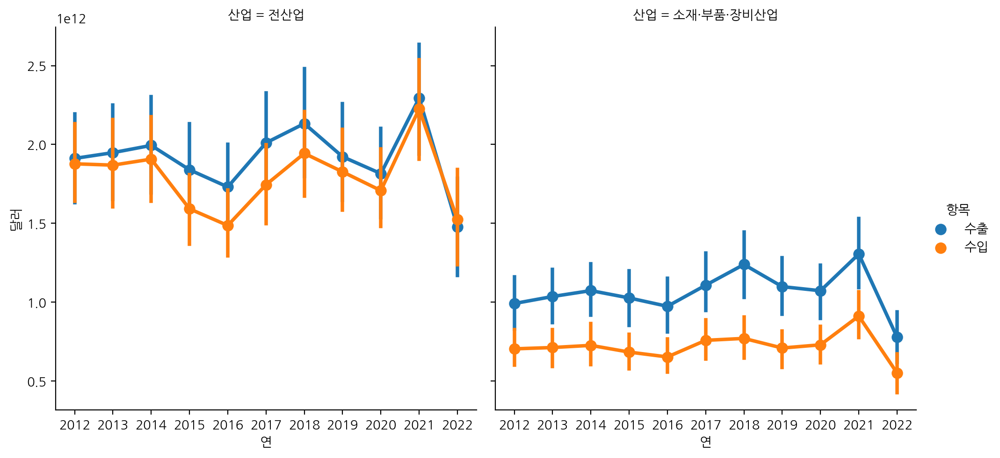

In [142]:
sns.catplot(data=df, x="연", y="달러", hue="항목", col="산업", estimator=np.sum, col_wrap=2, kind='point')